## Group 3: ML Assignment 5




## Let's start coding!

In [12]:
# !pip install lime

In [13]:
# !pip install SALib

In [14]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, recall_score, precision_score, roc_curve, auc, confusion_matrix
from lime import lime_tabular
import random
from imblearn.over_sampling import SMOTE
from SALib.sample import saltelli
from SALib.analyze import sobol
from lime import lime_tabular
from sklearn.linear_model import LogisticRegression

### Read the dataset

In [15]:
path = '/content/sample_data/Telecom.xlsx'
df = pd.read_excel(path, sheet_name='Telecom')
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4888 entries, 0 to 4887
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   CustomerID              4888 non-null   int64  
 1   PlanTaken               4888 non-null   int64  
 2   Age                     4662 non-null   float64
 3   TypeofContact           4863 non-null   object 
 4   CityTier                4888 non-null   int64  
 5   DurationOfPitch         4637 non-null   float64
 6   Occupation              4888 non-null   object 
 7   Gender                  4888 non-null   object 
 8   NumberOfPersons         4888 non-null   int64  
 9   NumberOfFollowups       4843 non-null   float64
 10  PlanPitched             4888 non-null   object 
 11  PreferredServiceStar    4862 non-null   float64
 12  MaritalStatus           4888 non-null   object 
 13  NumberOfUpgrades        4748 non-null   float64
 14  iPhone                  4888 non-null   

,CustomerID,PlanTaken,Age,CityTier,DurationOfPitch,NumberOfPersons,NumberOfFollowups,PreferredServiceStar,NumberOfUpgrades,iPhone,PitchSatisfactionScore,PhoneContract,NumberOfChildren,MonthlyIncome
count,4888.000000,4888.000000,4662.000000,4888.000000,4637.000000,4888.000000,4843.000000,4862.000000,4748.000000,4888.000000,4888.000000,4888.000000,4822.000000,4655.000000
mean,202443.500000,0.188216,37.622265,1.654255,15.490835,2.905074,3.708445,3.581037,3.236521,0.290917,3.078151,0.620295,1.187267,23619.853491
std,1411.188388,0.390925,9.316387,0.916583,8.519643,0.724891,1.002509,0.798009,1.849019,0.454232,1.365792,0.485363,0.857861,5380.698361
min,200000.000000,0.000000,18.000000,1.000000,5.000000,1.000000,1.000000,3.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1000.000000
25%,201221.750000,0.000000,31.000000,1.000000,9.000000,2.000000,3.000000,3.000000,2.000000,0.000000,2.000000,0.000000,1.000000,20346.000000
50%,202443.500000,0.000000,36.000000,1.000000,13.000000,3.000000,4.000000,3.000000,3.000000,0.000000,3.000000,1.000000,1.000000,22347.000000
75%,203665.250000,0.000000,44.000000,3.000000,20.000000,3.000000,4.000000,4.000000,4.000000,1.000000,4.000000,1.000000,2.000000,25571.000000
max,204887.000000,1.000000,61.000000,3.000000,127.000000,5.000000,6.000000,5.000000,22.000000,1.000000,5.000000,1.000000,3.000000,98678.000000


# Feature Engineering

## Remove duplicates

In [16]:
df
df.drop_duplicates()

,CustomerID,PlanTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersons,NumberOfFollowups,PlanPitched,PreferredServiceStar,MaritalStatus,NumberOfUpgrades,iPhone,PitchSatisfactionScore,PhoneContract,NumberOfChildren,Designation,MonthlyIncome
0,200000,1,41.0,Self Enquiry,3,6.0,Salaried,Female,3,3.0,Deluxe,3.0,Single,1.0,1,2,1,0.0,Manager,20993.0
1,200001,0,49.0,Company Invited,1,14.0,Salaried,Male,3,4.0,Deluxe,4.0,Divorced,2.0,0,3,1,2.0,Manager,20130.0
2,200002,1,37.0,Self Enquiry,1,8.0,Free Lancer,Male,3,4.0,Basic,3.0,Single,7.0,1,3,0,0.0,Executive,17090.0
3,200003,0,33.0,Company Invited,1,9.0,Salaried,Female,2,3.0,Basic,3.0,Divorced,2.0,1,5,1,1.0,Executive,17909.0
4,200004,0,NaN,Self Enquiry,1,8.0,Small Business,Male,2,3.0,Basic,4.0,Divorced,1.0,0,5,1,0.0,Executive,18468.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4883,204883,1,49.0,Self Enquiry,3,9.0,Small Business,Male,3,5.0,Deluxe,4.0,Unmarried,2.0,1,1,1,1.0,Manager,26576.0
4884,204884,1,28.0,Company Invited,1,31.0,Salaried,Male,4,5.0,Basic,3.0,Single,3.0,1,3,1,2.0,Executive,21212.0
4885,204885,1,52.0,Self Enquiry,3,17.0,Salaried,Female,4,4.0,Standard,4.0,Married,7.0,0,1,1,3.0,Senior Manager,31820.0
4886,204886,1,19.0,Self Enquiry,3,16.0,Small Business,Male,3,4.0,Basic,3.0,Single,3.0,0,5,0,2.0,Executive,20289.0


### Drop Occupation - Free Lancer

In [17]:
df = df.drop(df[df["Occupation"] == 'Free Lancer'].index)

## Select features
- Select independent features as X
- Select dependent feature for y

In [18]:
def select_features_for_model(df):
    df=df.drop(columns='CustomerID', axis=1)
    X = df.drop("PlanTaken", axis=1)
    y = df["PlanTaken"]
    X.info()
    return X, y

X, y = select_features_for_model(df)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4886 entries, 0 to 4887
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     4660 non-null   float64
 1   TypeofContact           4861 non-null   object 
 2   CityTier                4886 non-null   int64  
 3   DurationOfPitch         4635 non-null   float64
 4   Occupation              4886 non-null   object 
 5   Gender                  4886 non-null   object 
 6   NumberOfPersons         4886 non-null   int64  
 7   NumberOfFollowups       4841 non-null   float64
 8   PlanPitched             4886 non-null   object 
 9   PreferredServiceStar    4860 non-null   float64
 10  MaritalStatus           4886 non-null   object 
 11  NumberOfUpgrades        4746 non-null   float64
 12  iPhone                  4886 non-null   int64  
 13  PitchSatisfactionScore  4886 non-null   int64  
 14  PhoneContract           4886 non-null   

## Split Train & Test

In [19]:
def split_train_test(X, y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    return X_train, X_test, y_train, y_test

X_train, X_test, y_train, y_test = split_train_test(X, y)

## Data Cleaning

### Gender

In [20]:
# Checking the unique values of gender in X_train
X_train['Gender'].unique()

array(['Male', 'Female', 'Fe Male'], dtype=object)

In [21]:
X_train['Gender'].value_counts()

Male       2334
Female     1452
Fe Male     122
Name: Gender, dtype: int64

In [22]:
# Correcting the Fe Male gender as Female
def clean_Gender(df):
    df['Gender'] = df['Gender'].map({'Male': 'Male', 'Female':'Female', 'Fe Male': 'Female'})
    return df

# Clean Train
X_train = clean_Gender(X_train)

# Clean Test
X_test = clean_Gender(X_test)

In [23]:
X_train['Gender'].value_counts()

Male      2334
Female    1574
Name: Gender, dtype: int64

### MaritalStatus

In [24]:
X_train['MaritalStatus'].value_counts()

Married      1895
Divorced      751
Single        717
Unmarried     545
Name: MaritalStatus, dtype: int64

In [25]:
# Merging Unmarried to Single
def clean_MaritalStatus(df):
    df['MaritalStatus'] = df['MaritalStatus'].map({'Married': 'Married',
                                                  'Divorced':'Divorced',
                                                  'Single': 'Single',
                                                  'Unmarried': 'Single'})
    return df

# Clean Train
X_train = clean_MaritalStatus(X_train)

# Clean Test
X_test = clean_MaritalStatus(X_test)

In [26]:
X_train['MaritalStatus'].value_counts()

Married     1895
Single      1262
Divorced     751
Name: MaritalStatus, dtype: int64

## Impute missing values

In [27]:
X_train.isnull().sum()

Age                       176
TypeofContact              19
CityTier                    0
DurationOfPitch           211
Occupation                  0
Gender                      0
NumberOfPersons             0
NumberOfFollowups          37
PlanPitched                 0
PreferredServiceStar       20
MaritalStatus               0
NumberOfUpgrades          122
iPhone                      0
PitchSatisfactionScore      0
PhoneContract               0
NumberOfChildren           54
Designation                 0
MonthlyIncome             182
dtype: int64

In [28]:
def impute_features(df):
    numeric_cols = ['DurationOfPitch', 'MonthlyIncome', 'Age', 'NumberOfUpgrades', 'NumberOfChildren', 'NumberOfFollowups', 'PreferredServiceStar']
    mean_values = df[numeric_cols].mean()

    df[numeric_cols] = df[numeric_cols].fillna(mean_values)

    categorical_cols = ['TypeofContact']
    df[categorical_cols] = df[categorical_cols].fillna(df[categorical_cols].mode().iloc[0])


    return df


X_train = impute_features(X_train)

X_train.isnull().sum()

X_test = impute_features(X_test)

## Handling Outliers
* Income can be dependent on Occupation and Designation, therefore removing the outliers based on them

In [29]:
def handle_outliers(df):

    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

    # Calculateing IQR
    Q1 = df[numeric_columns].quantile(0.25)
    Q3 = df[numeric_columns].quantile(0.75)
    IQR = Q3 - Q1

    # Outlier threshold - 1.5 times IQR
    threshold = 1.5

    # Finding the outliers using the threshold value
    outliers = np.logical_or(df[numeric_columns] < (Q1 - threshold * IQR), df[numeric_columns] > (Q3 + threshold * IQR))

    # Total outliers in each numerical columns
    outliers_count = outliers.sum(axis=0)

    columns_to_replace_with_median = ['DurationOfPitch', 'NumberOfUpgrades']
    df[columns_to_replace_with_median] = np.where(outliers[columns_to_replace_with_median], df[columns_to_replace_with_median].median(), df[columns_to_replace_with_median])

    # Set income thresholds based on the 95th percentile of MonthlyIncome for each designation
    thresholds_by_designation = df.groupby('Designation')['MonthlyIncome'].quantile(0.95)

    # Replace outliers based on IQR for each designation and occupation
    for (designation, occupation), group in df.groupby(['Designation', 'Occupation']):
        # Use the threshold corresponding to the designation
        income_threshold = thresholds_by_designation.get(designation, 0)

        Q1 = group['MonthlyIncome'].quantile(0.25)
        Q3 = group['MonthlyIncome'].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Replace outliers with the threshold value
        df.loc[(df['Designation'] == designation) & (df['Occupation'] == occupation) &
               ((df['MonthlyIncome'] < lower_bound) | (df['MonthlyIncome'] > upper_bound)),
               'MonthlyIncome'] = income_threshold
    return df

X_train = handle_outliers(X_train)

## Encoding

### PlanPitched - Ordinal encoding

In [30]:
X_train['PlanPitched'].unique()

array(['Basic', 'Deluxe', 'Super Deluxe', 'Standard', 'King'],
      dtype=object)

In [31]:
def encode_PlanPitched(df):
    # Define the custom order
    custom_order_PlanPitched = ['Basic', 'Standard', 'Deluxe', 'Super Deluxe', 'King']

    # Initialize the OrdinalEncoder with the custom order
    encoder = OrdinalEncoder(categories=[custom_order_PlanPitched])

    # Fit and transform the labels
    df['PlanPitched'] = encoder.fit_transform(df['PlanPitched'].values.reshape(-1,1))

    return df

# Encoding on Train
X_train = encode_PlanPitched(X_train)

# Encoding on Test
X_test = encode_PlanPitched(X_test)

### Encode other categorical features

In [32]:
def encode_features(df):
    columns_to_encode = ['Gender', 'TypeofContact', 'Occupation', 'MaritalStatus', 'Designation']
    df = pd.get_dummies(df, columns=columns_to_encode)
    return df

# Encoding on Train
X_train = encode_features(X_train)

# Encoding on Test
X_test = encode_features(X_test)

In [33]:
X_train_columns = X_train.columns
X_test_columns = X_test.columns

## Scale data

In [34]:
def scale_data(df):
    scaler = StandardScaler()
    df = scaler.fit_transform(df)
    return df

X_train = scale_data(X_train)
X_test = scale_data(X_test)


# Helpers

## Helper to display model metrics and AUC under ROC curve

In [35]:
def show_auc_under_roc(y_test, y_pred, y_prob):

    # Compute the false positive rate, true positive rate, and thresholds
    fpr, tpr, thresholds = roc_curve(y_test, y_prob)

    accuracy = accuracy_score(y_test, y_pred)
    auc_score = auc(fpr, tpr)

    print("Accuracy: ", accuracy)
    print("Precision:", precision_score(y_test, y_pred, average="weighted"))
    print("Recall:", recall_score(y_test, y_pred, average="weighted"))

    plt.figure()
    plt.plot(fpr, tpr, label='ROC curve (AUC = %0.2f)' % auc_score)
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc='lower right')
    plt.show()

## Helper to display confusion matrix

In [36]:
def show_confusion_matrix(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)

    # Create a heatmap of the confusion matrix
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")

    # Add labels, title, and ticks to the plot
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix for PlanTaken")
    plt.xticks(ticks=[0, 1])
    plt.yticks(ticks=[0, 1])

    # Show the plot
    plt.show()

## SVM with Regulariztion & `rbf` kernel & SMOTE

In [37]:

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

svm_model = SVC(kernel='rbf', C=13.0, probability=True)
svm_model.fit(X_train_resampled, y_train_resampled)

# Make predictions on the test set
y_pred = svm_model.predict(X_test)
y_prob = svm_model.predict_proba(X_test)[:, 1]

#show_auc_under_roc(y_test, y_pred, y_prob)
#show_confusion_matrix(y_test, y_pred)






## LIME initialize


In [38]:


explainer = lime_tabular.LimeTabularExplainer(X_train, mode="classification",
                                              class_names=['0','1'],
                                              feature_names=X_train_columns,
                                             )


In [39]:
y_test=np.array(y_test)
idx = random.randint(1, len(X_test))

predicted_label = svm_model.predict(X_test[idx].reshape(1, -1))[0]

print("Prediction : ", predicted_label)
print("Actual : ",y_test[idx] )


Prediction :  0
Actual :  0


## Visualizing Feature Importance

In [40]:
explanation = explainer.explain_instance(X_test[idx], svm_model.predict_proba,
                                         num_features=X_train.shape[1])

explanation.show_in_notebook()

In case of complex models(Black-Box) that have lots of features interpreting the model becomes hard. In these circumstances we can use LIME local interpretability to analyse which features are affecting predicted outcome the most.
We can understand that:
1. Model has high confidence in predicting that in this instance the class is 0 based on the probability value of 1.
2.  Features that push the prediction towards class 0 are shown in blue, while those pushing towards class 1 are in orange.
3. 'Designation_VP' and 'Occupation_Large Business' are the most significant features that contribute to the prediction of class 0 having the values -0.20 and -0.30 respectively.
4. Features such as 'DurationOfPitch' and 'MonthlyIncome' do not have much contribution.


## Visualizing Features Importance for Wrong Predictions

In [41]:
y_test=np.array(y_test)
preds = svm_model.predict(X_test)

false_preds = np.argwhere((preds != y_test)).flatten()

idx  = random.choice(false_preds)

predicted_label = svm_model.predict(X_test[idx].reshape(1, -1))[0]

print("Prediction : ", predicted_label)
print("Actual :     ",y_test[idx] )



Prediction :  0
Actual :      1


In [42]:
explanation = explainer.explain_instance(X_test[idx], svm_model.predict_proba)

explanation.show_in_notebook()

1. The bar chart at the top left corner shows the prediction probabilities for two classes (0 and 1). The model predicts class 1 with a probability of 0.59 and class 0 with a probability of 0.41, indicating the model does not have a lot of confidence in its prediction.
2. The features that have the most significant impact on the prediction are 'Designation_Manager' with a value of 1.40 and 'MaritalStatus_Married' with a value of 1.09, both pushing towards class 1. In contrast, 'Occupation_Large Business' with a value of -0.30 and 'Designation_VP' with a value of -0.20 are pushing towards class 0.


**Local Feature importance interpreted for 1 instance**

In [43]:
explanation = explainer.explain_instance(X_test[idx], svm_model.predict_proba,
                                         num_features=1)

**If we need to check which feature affects outcome the most we can pass number of feature as 1 to n or all.**
   

In [44]:
explanation.show_in_notebook()

1. LIME with 1 feature provides us the feature which is affecting outcome the most.
2. We can see that 'Designation_AVP' contributes to 1 outcome the most in this instance.

**Local Feature importance interpreted for 2 instances**

In [45]:
explanation = explainer.explain_instance(X_test[idx], svm_model.predict_proba,
                                         num_features=2)

In [46]:
explanation.show_in_notebook(show_table = True)

1. Taking 2 features of LIME (Local interpretation) provides the 2 best features which affect the predicted outcome the most.
2. Designation_VP and Designation_AVP are the features that affect the outcome the most.
3. Feature Designation_VP affect probability of 0 outcome
4. Feature Designation_AVP affect probability of 1 outcome
5. From pyplot figure we will get better understanding

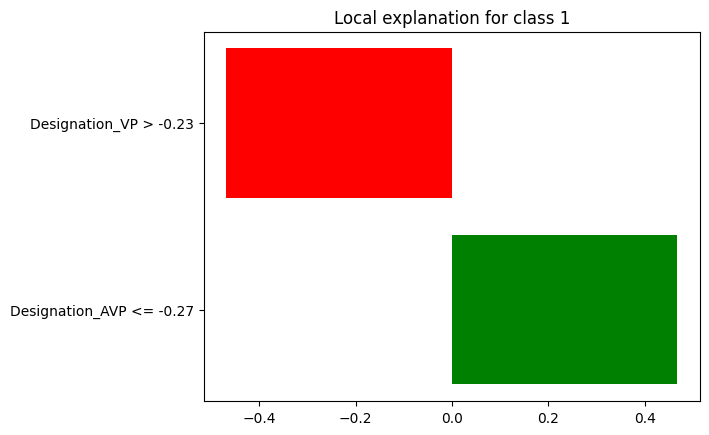

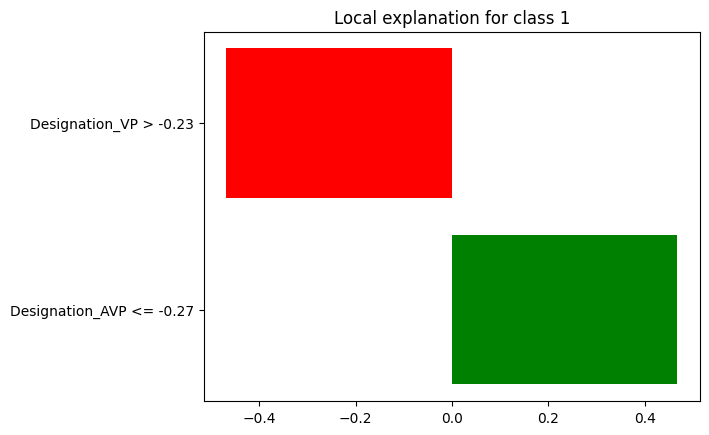

In [47]:
explanation.as_pyplot_figure()

The length of the bars represents the magnitude of the contribution of each feature to the model's prediction. A longer bar means a stronger influence. The direction of the bars (left for negative, right for positive) indicates whether the feature makes the prediction of class 1 more or less likely. Both charts are almost identical.
1. Designation_AVP has a negative weight of -0.27, suggesting that the value of this feature for the instance being explained is less than or equal to -0.27, which is contributing negatively to the prediction of class 1.
2. Designation_VP has a positive weight, indicating that the value of this feature is greater than -0.23, contributing positively to the prediction of class 1.

***Local Feature importance interpreted for 3 instances***

In [48]:
explanation = explainer.explain_instance(X_test[idx], svm_model.predict_proba,
                                         num_features=3)

In [49]:
explanation.show_in_notebook(show_table = True)

1. Feature Designation_AVP contribute to probability of 1
2. Designation_VP and Designation_Manager Contribute to probability of 0
3. For three features interpretation, from the statements above we can determine that class 0 outcome has max weightage on predicated outcome compared to class 0.
3. To understand it better, we will use pyplot graph

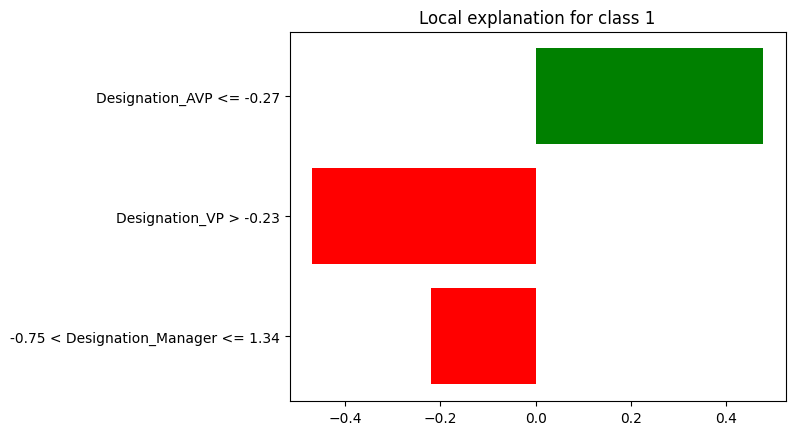

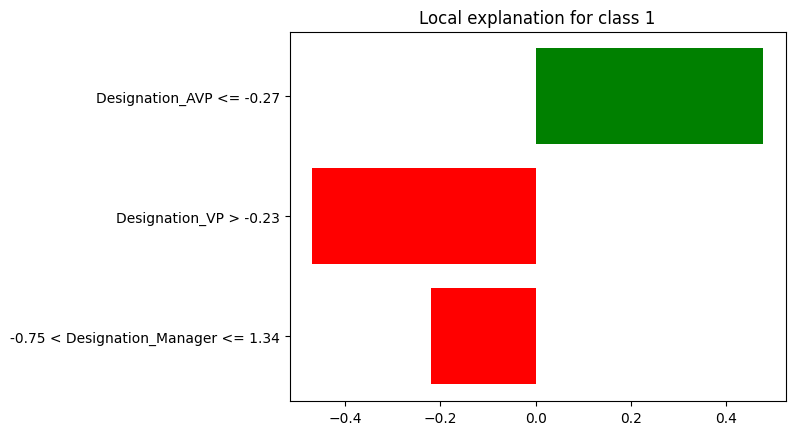

In [50]:
explanation.as_pyplot_figure()

1. Designation_VP has a positive weight towards class 1. This plot suggests that when the 'Designation_VP' feature is greater than -0.23, it positively influences the prediction towards class 1.
2. In contrast Designation_AVP has a negative weight towards class 1. The condition "Designation_AVP <= -0.27" indicates that when 'Designation_AVP' is less than or equal to -0.27, it negatively influences the prediction towards class 1.
3. Similar to 'Designation_VP', 'Occupation_Large Business' also has a positive weight towards class 1, with the plot indicating its influence when "Occupation_Large Business > -0.32".


***Local Feature importance interpreted for all instances***

In [51]:
explanation = explainer.explain_instance(X_test[idx], svm_model.predict_proba,
                                         num_features=X_train.shape[1])

In [52]:
explanation.show_in_notebook(show_table = True)

1. Here we have seperated which features contribute to probability of 0 or 1.

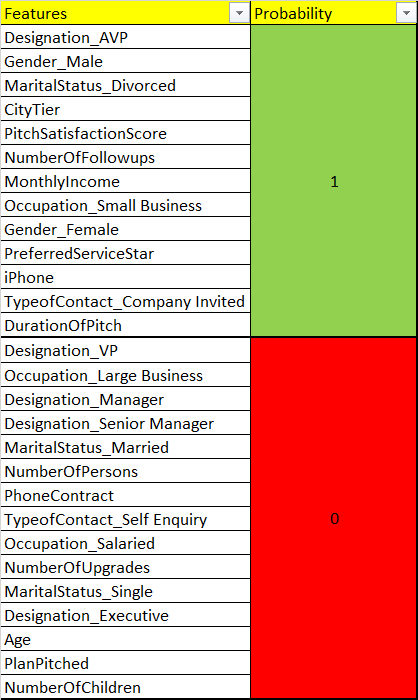

1. From above comparison we understand that more features contribute to 0 probability.
2. We can deduct that probability of class 0 features have more weightage on predicated outcome than class 1.

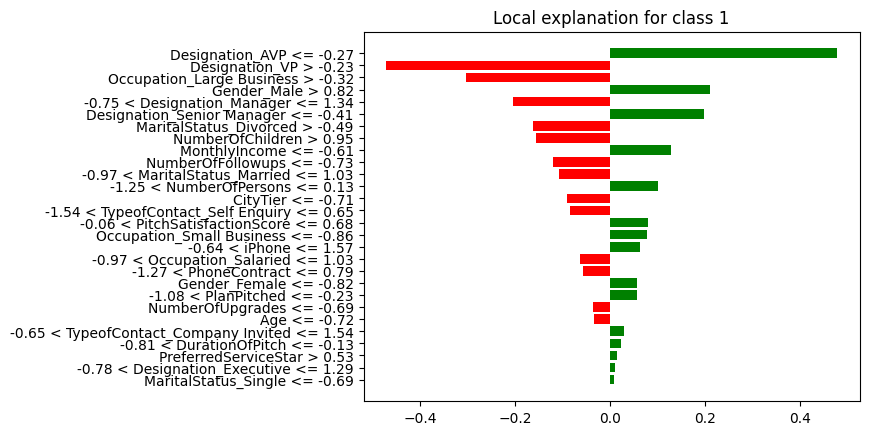

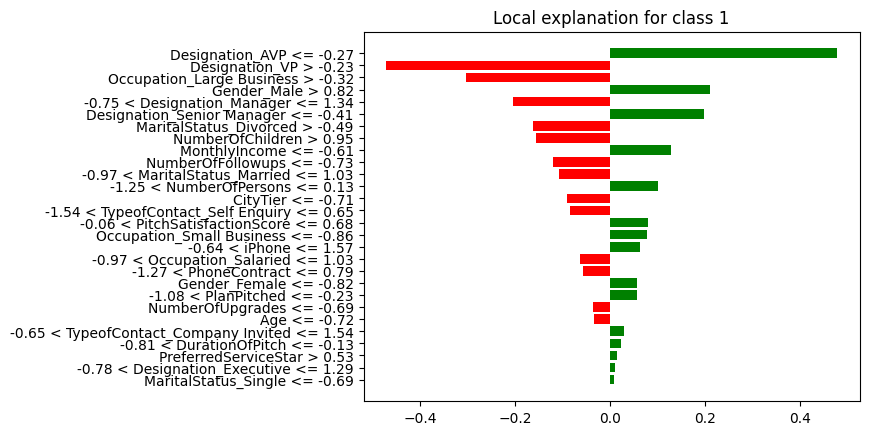

In [53]:
explanation.as_pyplot_figure()

## Shap initialize

In [54]:
!pip install numpy==1.24
!pip install --upgrade numba
!pip install shap
import shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 13.5 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires python-multipart, which is not installed.
lida 0.0.10 requires uvicorn, which is not installed.
seaborn 0.12.2 requires numpy!=1.24.0,>=1.17, but you have numpy 1.24.0 which is incompatible.


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 4.8 MB/s eta 0:00:00


In [55]:
# Taking 50 samples as shap is taking too much time to run
sample = 50
b = shap.sample(X_train, sample)

# Creating a KernelExplainer using the SVM model's predict_proba function
explainer = shap.KernelExplainer(svm_model.predict_proba, b,feature_names=X_train.shape[1])

# Computing shapley values for a subset
shap_values = explainer.shap_values(X_test[:sample])

  0%|          | 0/50 [00:00<?, ?it/s]

## Global Feature Importance

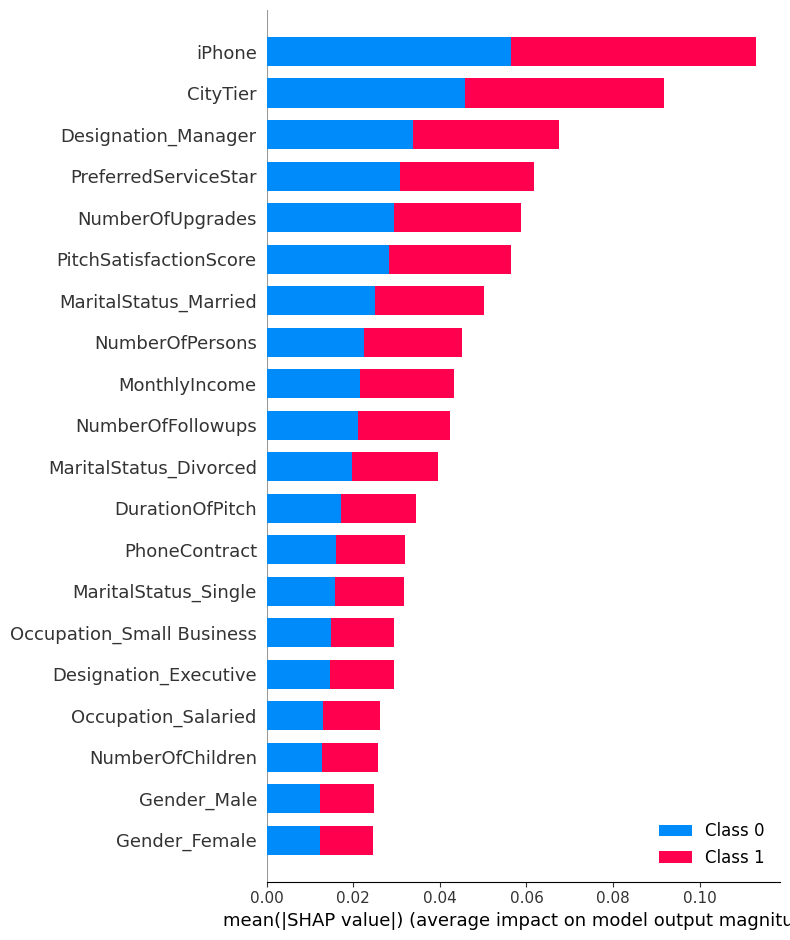

In [56]:
# Summary plot for global feature importance
shap.summary_plot(shap_values, X_test,feature_names=X_train_columns)

This Bar chart represents the mean SHAP values for different features in a dataset, with two classes indicated by blue and red bars. The SHAP values indicate the impact of each feature on the model's output. The features are listed on the y-axis of this graph, and their corresponding mean SHAP values are on the x-axis.

1. 'iPhone', 'CityTier', and 'Designation_Manager' have the highest mean SHAP values for Class 1 (red bars). suggesting they are the most important features that positively impact the model's prediction for Class 1. Additionaly, these features have a negative impact on the prediction of Class 0 (blue bars), as indicated by the bars plotted in the opposite direction.
2. For Class 0, features like 'Gender_Female', 'PlanPitched', and 'Occupation_Salaried' seem to have the highest mean SHAP values, indicating they are the most important for predicting Class 0.
    


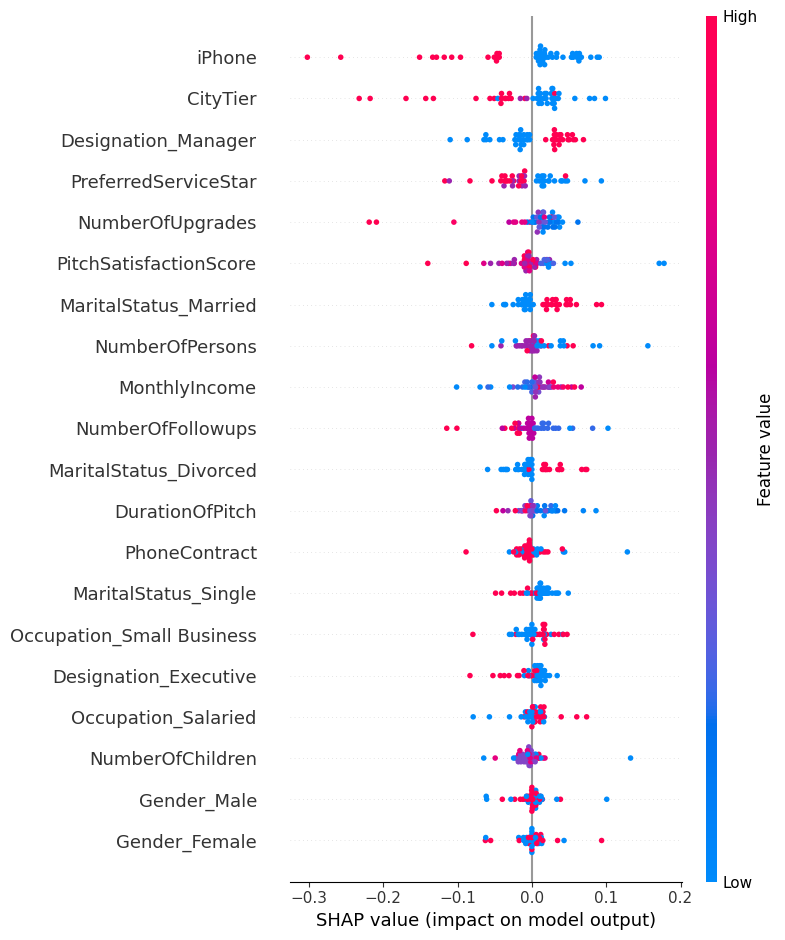

In [57]:
# Create a summary plot for Shapley values of the first class
shap.summary_plot(shap_values[0], X_test[:50], feature_names=X_test_columns)

A beeswarm plot shows the distribution of the SHAP values for each feature on the x-axis. Each point represents the SHAP value for a feature for an individual prediction.
Red signifies high, Blue signifies low, indicating how the value of the feature impacts the prediction.

1. 'iPhone' has a mix of positive and negative high-impact SHAP values, suggesting it is a significant factor in the model's predictions for both classes.
2. 'CityTier' and 'Designation_Manager' also show a strong influence on the model's predictions with a mix of positive and negative values.
3. Features at the bottom of the plot, some of which are 'Gender_Female' and 'Designation_Senior Manager', appear to have a lower impact on the model's predictions, as indicated by the groupin of points closer to the zero line in the plot.


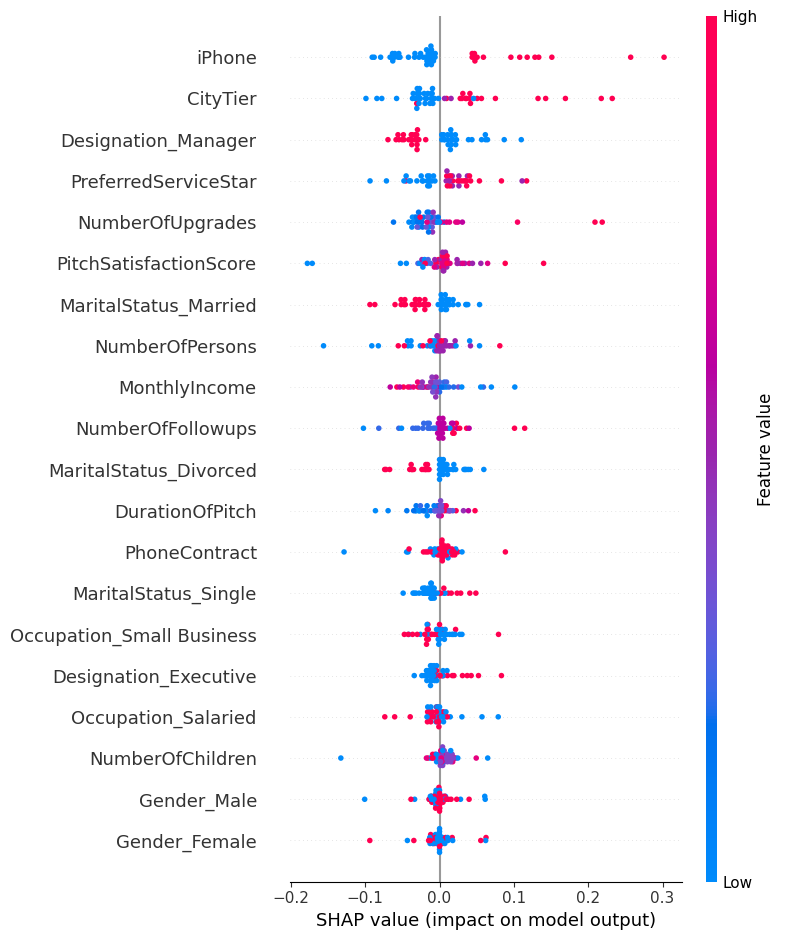

In [58]:
# Create a summary plot for Shapley values of the second class
shap.summary_plot(shap_values[1], X_test[:50], feature_names=X_test_columns)

**The summary plot shows the feature importance of each feature in the model. The results show that Iphone, CityTier, DesignationManager play major roles in determining the results.**
1. Features like 'iPhone' and 'CityTier' show a mix of positive and negative SHAP values, suggesting that depending on the context, these features can either increase or decrease the likelihood of the second class.
2. Being a manager is likely associated with an increased likelihood of the second class, indicated by 'Designation_Manager' mostly showing positive SHAP values for high feature values.
3. Some features, such as 'MonthlyIncome' and 'NumberOfPersons', show a cluster of points around zero, but with some spread. This could mean that these features might have a varying impact on the model's output due to other reasons.
4. 'Gender_Female' and 'PlanPitched', have a less significant impact on the model's output for the second class.  have They have a smaller spread of SHAP values and are clustered closer to zero, being at the bottom of the plot.
5. There are a few outliers, particularly for features like 'CityTier' and 'NumberOfUgrades', where some SHAP values are quite far from the cluster.


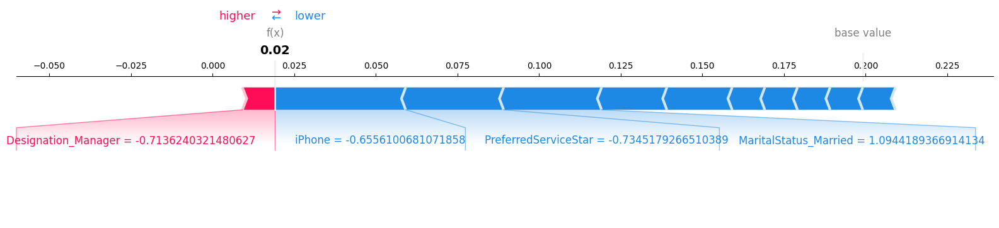

In [59]:
shap_values_rounded = [np.round(sv, 2) for sv in shap_values]
shap.plots.force(explainer.expected_value[1], shap_values_rounded[1][4, :], X_test[4, :],matplotlib = True, feature_names=X_test_columns)

1. MaritalStatus_Married: This feature has the highest positive SHAP value of approximately 1.094, suggesting that being married has a strong positive impact on the model's prediction for this particular instance.
2. PreferredServiceStar: This feature has a negative SHAP value of approximately -0.735, indicating that the value of this feature for the instance negatively influences the prediction.
3. iPhone: The iPhone feature also has a negative SHAP value of approximately -0.656, which means that for this instance, having an iPhone (or the specific value of this feature) decreases the model's output.
4. Designation_Manager: This feature has a negative SHAP value of approximately -0.713, suggesting that the designation of a manager is associated with a decrease in the model's output for this instance.


## Logistic Regression

Accuracy:  0.7464212678936605
Precision: 0.8104417529594131
Recall: 0.7464212678936605


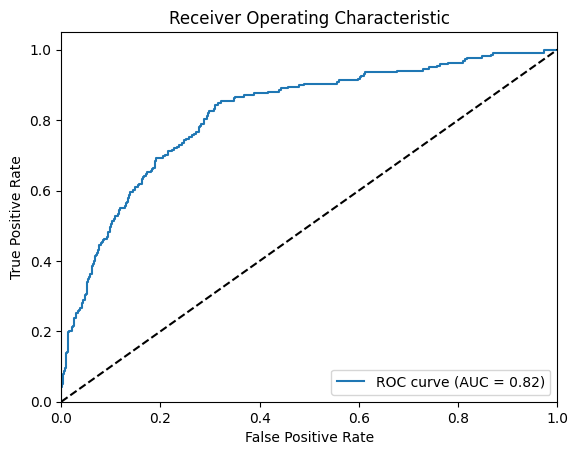

In [60]:
def build_logistic_regression_model(X_train, X_test, y_train, y_test):
    smote = SMOTE(random_state=42)
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

    lr_model = LogisticRegression(penalty="l2", C=13, solver="lbfgs")
    lr_model.fit(X_train_resampled, y_train_resampled)

    y_pred = lr_model.predict(X_test)
    y_prob = lr_model.predict_proba(X_test)[:, 1]

    show_auc_under_roc(y_test, y_pred, y_prob)
    #show_confusion_matrix(y_test, y_pred)

    return lr_model, y_pred, y_prob

lr_model, y_pred_lr, y_prob_lr = build_logistic_regression_model(X_train, X_test, y_train, y_test)